In [2]:
# import libraries
import pandas as pd
import geopandas as gpd

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

import contextily as ctx

# for interactive plots, similar to geopands (your choice between folium vs plotly)
import plotly.express as px

# to import open data - in order to use the API links in some of the gov websites
from sodapy import Socrata

import requests

In [3]:
# connect to the data portal
client = Socrata("data.lacity.org", None)

# Specify the year you want to retrieve
year = 2020

# Construct SoQL query to filter data by date range for the specified year
query = f"SELECT * WHERE date_occ >= '{2020}-01-01T00:00:00.000' AND date_occ < '{2020 + 1}-01-01T00:00:00.000'"


# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy. 250,000 would take a long time to upload/be slow
results = client.get("d5tf-ez2w", query = query)

# Convert to pandas DataFrame containing 2020 collisions data
df = pd.DataFrame.from_records(results)

# Getting to know our Traffic Collision Data

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dr_no         1000 non-null   object
 1   date_rptd     1000 non-null   object
 2   date_occ      1000 non-null   object
 3   time_occ      1000 non-null   object
 4   area          1000 non-null   object
 5   area_name     1000 non-null   object
 6   rpt_dist_no   1000 non-null   object
 7   crm_cd        1000 non-null   object
 8   crm_cd_desc   1000 non-null   object
 9   mocodes       987 non-null    object
 10  vict_age      956 non-null    object
 11  vict_sex      973 non-null    object
 12  vict_descent  971 non-null    object
 13  premis_cd     992 non-null    object
 14  premis_desc   992 non-null    object
 15  location      1000 non-null   object
 16  cross_street  944 non-null    object
 17  location_1    1000 non-null   object
dtypes: object(18)
memory usage: 140.8+ KB


In [49]:
df.tail(2)

,dr_no,date_rptd,date_occ,time_occ,area,area_name,rpt_dist_no,crm_cd,crm_cd_desc,mocodes,vict_age,vict_sex,vict_descent,premis_cd,premis_desc,location,cross_street,location_1
998,201204624,2020-01-08T00:00:00.000,2020-01-08T00:00:00.000,2300,12,77th Street,1273,997,TRAFFIC COLLISION,0605 3037 3006 3028 3030 3101,53,F,B,101,STREET,WILTON PL,MANCHESTER,"{'latitude': '33.96', 'longitude': '-118.315',..."
999,201504386,2020-01-08T00:00:00.000,2020-01-08T00:00:00.000,1915,15,N Hollywood,1591,997,TRAFFIC COLLISION,3011 3028 3030 3037 3032 3102 4026,80,M,O,101,STREET,VENTURA BL,LAUREL CANYON BL,"{'latitude': '34.1434', 'longitude': '-118.397..."


I'm going to import a CSV instead, because the year 2020 contains 750k data points for the city of LA. Hopefully this approach will work! 

In [50]:
#Using CSV in order to increase data input to 43k, instead of API limit of 1000. 
tcd = pd.read_csv('Traffic_Collisions_2020.csv')

In [51]:
tcd.head(2)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,Victim Age,Victim Sex,Victim Descent,Premise Code,Premise Description,Address,Cross Street,Latitude,Longitude
0,200113538,6/17/2020,6/14/2020,2030,1,Central,195,997,TRAFFIC COLLISION,0605 3101 3401 3701 3006 3030 1501,31.0,F,H,101.0,STREET,15TH,MAPLE,34.0326,-118.2589
1,200518005,12/19/2020,12/19/2020,2205,5,Harbor,514,997,TRAFFIC COLLISION,3036 3004 3026 3029 3101,39.0,F,H,101.0,STREET,LOMITA,FIGUEROA,33.7982,-118.2830


In [52]:
tcd.tail(2)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,Victim Age,Victim Sex,Victim Descent,Premise Code,Premise Description,Address,Cross Street,Latitude,Longitude
42380,220805929,2/17/2022,2/24/2020,710,8,West LA,898,997,TRAFFIC COLLISION,3003 3029 4027 3025 3035 3037 3104 3401 3701,61.0,M,W,101.0,STREET,CANFIELD AV,GIBSON ST,34.0381,-118.3917
42381,201406555,2/13/2020,2/13/2020,115,14,Pacific,1473,997,TRAFFIC COLLISION,3003 3029 3037 3101 3401 3701 4027 1402 3034 3027,49.0,F,W,101.0,STREET,PERSHING DR,CAMPDELL ST,33.9574,-118.4431


In [53]:
tcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42382 entries, 0 to 42381
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DR Number               42382 non-null  int64  
 1   Date Reported           42382 non-null  object 
 2   Date Occurred           42382 non-null  object 
 3   Time Occurred           42382 non-null  int64  
 4   Area ID                 42382 non-null  int64  
 5   Area Name               42382 non-null  object 
 6   Reporting District      42382 non-null  int64  
 7   Crime Code              42382 non-null  int64  
 8   Crime Code Description  42382 non-null  object 
 9   MO Codes                40409 non-null  object 
 10  Victim Age              39712 non-null  float64
 11  Victim Sex              41475 non-null  object 
 12  Victim Descent          41419 non-null  object 
 13  Premise Code            41540 non-null  float64
 14  Premise Description     41539 non-null

Looks like this was a better approach for kicking off our analysis! 

In [54]:
#lets fix the spaces in the variable names, because it drives us nuts later! 
tcd.rename(columns={'old column name with spaces': 'new_column_name',
                    'Victim Age' : 'victim_age',
                    'Victim Sex' : 'victim_sex',
                    'Victim Descent' : 'victim_descent'
                   }, inplace=True)
tcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42382 entries, 0 to 42381
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DR Number               42382 non-null  int64  
 1   Date Reported           42382 non-null  object 
 2   Date Occurred           42382 non-null  object 
 3   Time Occurred           42382 non-null  int64  
 4   Area ID                 42382 non-null  int64  
 5   Area Name               42382 non-null  object 
 6   Reporting District      42382 non-null  int64  
 7   Crime Code              42382 non-null  int64  
 8   Crime Code Description  42382 non-null  object 
 9   MO Codes                40409 non-null  object 
 10  victim_age              39712 non-null  float64
 11  victim_sex              41475 non-null  object 
 12  victim_descent          41419 non-null  object 
 13  Premise Code            41540 non-null  float64
 14  Premise Description     41539 non-null

In [55]:
# convert df to gdf
# since data is in lat/lon's assign the crs to WGS84 (epsg:4326)
gtcd = gpd.GeoDataFrame(tcd, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(tcd.Longitude, tcd.Latitude))
gtcd.head(2)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,victim_age,victim_sex,victim_descent,Premise Code,Premise Description,Address,Cross Street,Latitude,Longitude,geometry
0,200113538,6/17/2020,6/14/2020,2030,1,Central,195,997,TRAFFIC COLLISION,0605 3101 3401 3701 3006 3030 1501,31.0,F,H,101.0,STREET,15TH,MAPLE,34.0326,-118.2589,POINT (-118.25890 34.03260)
1,200518005,12/19/2020,12/19/2020,2205,5,Harbor,514,997,TRAFFIC COLLISION,3036 3004 3026 3029 3101,39.0,F,H,101.0,STREET,LOMITA,FIGUEROA,33.7982,-118.2830,POINT (-118.28300 33.79820)


In [56]:
# output the data's projection
gtcd.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [57]:
#calculate the bounding box we're starting with
bbox = gtcd.total_bounds

#print the bounding box
print("Bounding Box:")
print("min Longitude:", bbox[0])
print("min Latitude:", bbox[1])
print("max Longitude:", bbox[2])
print("max Latitude:", bbox[3])

Bounding Box:
min Longitude: -118.6663
min Latitude: 0.0
max Longitude: 0.0
max Latitude: 34.3343


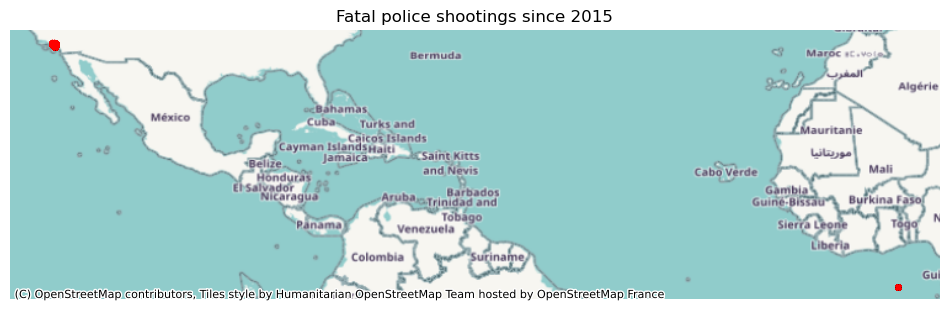

In [127]:
## testing out class code to see issue - Need to clip the size of the map


# start the plot (this code doesn't work here) 
fig, ax = plt.subplots(figsize=(12,12)) # figure size is size of axes lengith 12, creating an empty plot. 

# add the data options
gtcd.plot(ax=ax, # our empty plot is now being set to gdf which has all the data in it. 
        marker='X', #what is the marker we want to use for every xy point
        markersize=10, #font size
        color='red') # 

# turn the axes off
ax.axis('off') #

# give it a title
ax.set_title('Fatal police shootings since 2015')

# add a basemap - add this to the plot above, and that projected in the same system as above
ctx.add_basemap(ax, crs=4326) # note that we must specify the projection here (crs)

Look at that weird little x off the coast of africa! 

In [59]:
tracts = gpd.read_file('Census_Tracts_2020.geojson')

In [60]:
tracts.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 2495 entries, 0 to 2494
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJECTID       2495 non-null   int64   
 1   CT20           2495 non-null   object  
 2   LABEL          2495 non-null   object  
 3   ShapeSTArea    2495 non-null   float64 
 4   ShapeSTLength  2495 non-null   float64 
 5   geometry       2495 non-null   geometry
dtypes: float64(2), geometry(1), int64(1), object(2)
memory usage: 117.1+ KB


In [61]:
tracts.head(3)

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."


In [62]:
tracts.set_crs('epsg:4326').head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [63]:
#calculate the bounding box for LA City - change to our data frame? Use these numbers to clip, and cut out that outlier data piece. 
bbox = tracts.total_bounds

#print the bounding box
print("Bounding Box:")
print("min Longitude:", bbox[0])
print("min Latitude:", bbox[1])
print("max Longitude:", bbox[2])
print("max Latitude:", bbox[3])

Bounding Box:
min Longitude: -118.94519230312248
min Latitude: 32.75004470004891
max Longitude: -117.64638610517382
max Latitude: 34.823306968227755


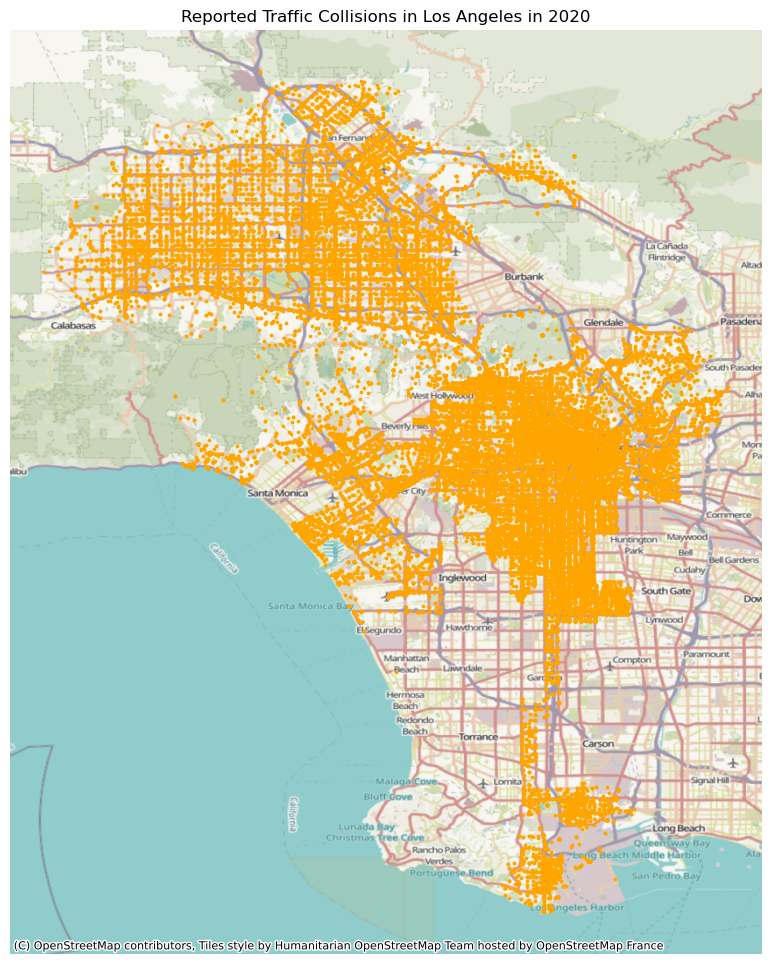

In [64]:
# start the plot (this code doesn't work here) 
fig, ax = plt.subplots(figsize=(12,12)) # figure size is size of axes lengith 12, creating an empty plot. 

# add the data options - cliping the bounds to meet the bounds of USA on map (total bounds of usa)
ax = gtcd.clip([-119,33,-118,35]).plot(ax=ax, # our empty plot is now being set to gdf which has all the data in it. 
        marker='o', #what is the marker we want to use for every xy point (literally an x)
        markersize= 3, #font size of the point
        color='orange') # color of the marker

# turn the axes off
ax.axis('off') #

# give it a title
ax.set_title('Reported Traffic Collisions in Los Angeles in 2020')

# add a basemap - add this to the plot above, and that projected in the same system as above
ctx.add_basemap(ax, crs=4326) # note that we must specify the projection here (crs)

# Exploring demographics of persons invovled in Traffic Collisions during 2020

In [65]:
tcd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42382 entries, 0 to 42381
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   DR Number               42382 non-null  int64  
 1   Date Reported           42382 non-null  object 
 2   Date Occurred           42382 non-null  object 
 3   Time Occurred           42382 non-null  int64  
 4   Area ID                 42382 non-null  int64  
 5   Area Name               42382 non-null  object 
 6   Reporting District      42382 non-null  int64  
 7   Crime Code              42382 non-null  int64  
 8   Crime Code Description  42382 non-null  object 
 9   MO Codes                40409 non-null  object 
 10  victim_age              39712 non-null  float64
 11  victim_sex              41475 non-null  object 
 12  victim_descent          41419 non-null  object 
 13  Premise Code            41540 non-null  float64
 14  Premise Description     41539 non-null

In [66]:
vsex = getattr(tcd,'victim_sex').unique().tolist()
print(vsex)

['F', 'M', nan, 'X', 'H']


### Victim Sex
Key/Meta data information
- Victim's Sex: NaN, X, H are all missing values.

In [67]:
sex_count = tcd.value_counts('victim_sex').reset_index(name = 'count')
sex_count

,victim_sex,count
0,M,24362
1,F,14274
2,X,2829
3,H,10


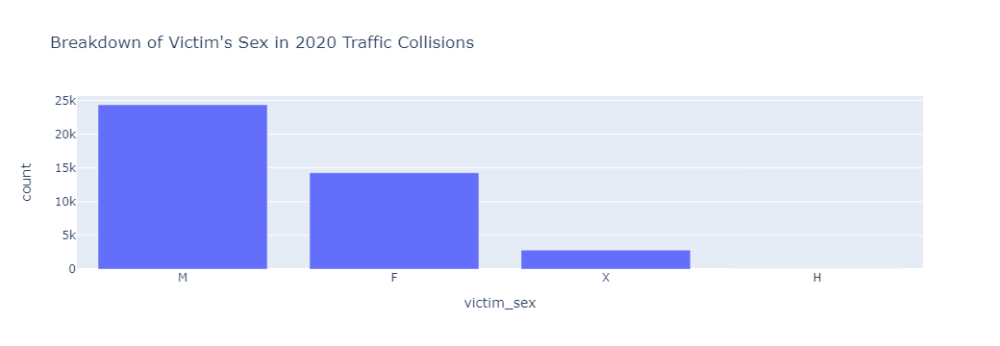

In [68]:
# plot the info
fig = px.bar(sex_count,
    x='victim_sex',
    y='count', 
    title = "Breakdown of Victim's Sex in 2020 Traffic Collisions")
fig.show()

### Victim Descent 
Key/Metadata info
'A' : 'Other Asian'
'B' : 'Black'
'C' : 'Chinese'
'D' : 'Cambodian'
'F' : 'Filipino'
'G' : 'Guamanian'
'H' : 'Hispanic/ Latin/ Mexican'
'I' : 'American Indian/ Alaskan Native'
'J' : 'Japanese'
'K' : 'Korean'
'L' : 'Laotian'
'O' : 'Other'
'P' : 'Pacific Islander'
'S' : 'Samoan'
'U' : 'Hawaiian'
'V' : 'Vietnamese'
'W' : 'White'
'X' : 'Unknown'
'Z' : 'Asian Indian'

In [75]:
vdescent = getattr(tcd,'victim_descent').unique().tolist()
print(vdescent)

['H', 'B', 'W', nan, 'O', 'X', 'K', 'A', 'V', 'C', 'F', 'S', 'U', 'P', 'I', 'J', 'D', 'Z', 'G', 'L']


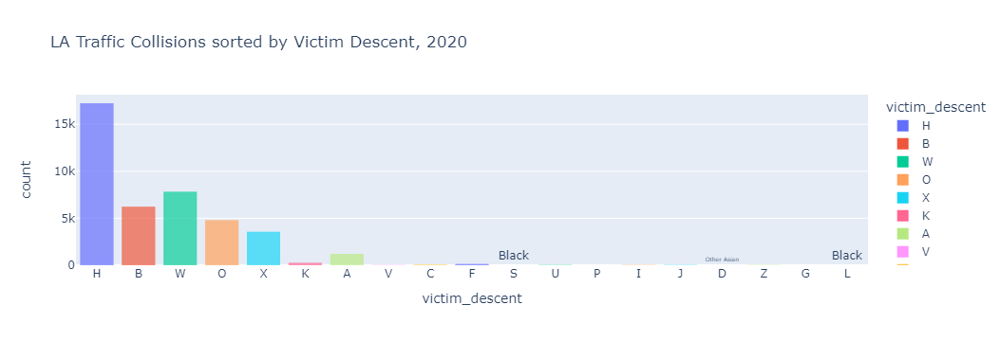

In [70]:
# add labels by providing a dict
fig = px.bar(
        tcd,
        x='victim_descent',
        title='LA Traffic Collisions sorted by Victim Descent, 2020',
        color='victim_descent',
        labels={ #feeding the dictionary - i.e. rename the columns. relabel x axis to arrest date, then y is ... use squiggly bracket
            'A' : 'Other Asian',
            'B' : 'Black',
            'C' : 'Chinese',
            'D' : 'Cambodian',
            'F' : 'Filipino',
            'G' : 'Guamanian',
            'H' : 'Hispanic/ Latin/ Mexican',
            'I' : 'American Indian/ Alaskan Native',
            'J' : 'Japanese',
            'K' : 'Korean',
            'L' : 'Laotian',
            'O' : 'Other',
            'P' : 'Pacific Islander',
            'S' : 'Samoan',
            'U' : 'Hawaiian',
            'V' : 'Vietnamese',
            'W' : 'White',
            'X' : 'Unknown',
            'Z' : 'Asian Indian'  
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# Update observation labels
fig.update_traces(text=['Other Asian', 'Black', 'Chinese'], textposition='outside')

# show the figure
fig.show()

In [1]:
# alternative approach to trying ot get labels to show.... also not working. 
#add labels by providing a dict
fig = px.bar(
        tcd,
        x='victim_descent',
        title='LA Traffic Collisions sorted by Victim Descent, 2020'
)

# Specify the new labels
new_labels = {
            'A' : 'Other Asian',
            'B' : 'Black',
            'C' : 'Chinese',
            'D' : 'Cambodian',
            'F' : 'Filipino',
            'G' : 'Guamanian',
            'H' : 'Hispanic/ Latin/ Mexican',
            'I' : 'American Indian/ Alaskan Native',
            'J' : 'Japanese',
            'K' : 'Korean',
            'L' : 'Laotian',
            'O' : 'Other',
            'P' : 'Pacific Islander',
            'S' : 'Samoan',
            'U' : 'Hawaiian',
            'V' : 'Vietnamese',
            'W' : 'White',
            'X' : 'Unknown',
            'Z' : 'Asian Indian'  
        }

# Update x-axis labels
#fig.update_xaxes(categoryorder='array', categoryarray=[new_labels.get(cat, cat) for cat in categories])

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

NameError: name 'px' is not defined

## Victim Ages

In [76]:
## Collision Victim Ages 
age_raw_count = tcd.value_counts('victim_age').reset_index(name = 'count')
age_raw_count

,victim_age,count
0,19.0,3804
1,30.0,1291
2,27.0,1078
3,25.0,1064
4,29.0,1059
...,...,...
84,94.0,2
85,95.0,2
86,98.0,2
87,91.0,1


In [113]:
age_cat = []
for age in tcd['victim_age']: 
    if pd.isnull(age):  # Check if age is missing
        age_cat.append('NaN')  # Append 'Missing' category
        #missing_count += 1  # Increment missing count
    elif age < 18: 
        age_cat.append('under 18')
    elif 18 <= age <= 24: 
        age_cat.append('18-24')
    elif 25 <= age <= 34:
        age_cat.append('25-34')
    elif 35 <= age <= 44:
        age_cat.append('35-44')
    elif 45 <= age <= 54: 
        age_cat.append('45-54')
    elif 55 <= age <= 64:
        age_cat.append('55-64')
    elif age >= 65:
        age_cat.append('65+')
# add this new variable to the dataframe next
tcd['age_by_cat'] = age_cat

#check to see if added to data frame correctly
tcd.head(2)

,DR Number,Date Reported,Date Occurred,Time Occurred,Area ID,Area Name,Reporting District,Crime Code,Crime Code Description,MO Codes,victim_age,victim_sex,victim_descent,Premise Code,Premise Description,Address,Cross Street,Latitude,Longitude,age_by_cat
0,200113538,6/17/2020,6/14/2020,2030,1,Central,195,997,TRAFFIC COLLISION,0605 3101 3401 3701 3006 3030 1501,31.0,F,H,101.0,STREET,15TH,MAPLE,34.0326,-118.2589,25-34
1,200518005,12/19/2020,12/19/2020,2205,5,Harbor,514,997,TRAFFIC COLLISION,3036 3004 3026 3029 3101,39.0,F,H,101.0,STREET,LOMITA,FIGUEROA,33.7982,-118.2830,35-44


In [114]:
age_count = tcd.value_counts('age_by_cat').reset_index(name = 'count')
age_count

,age_by_cat,count
0,25-34,10081
1,18-24,8137
2,35-44,7628
3,45-54,6088
4,55-64,4397
5,65+,3035
6,NaN,2670
7,under 18,346


In [115]:
# checking that we have the total number of observations!  
tcd.age_by_cat.count()

42382

In [116]:
tcd.age_by_cat.describe()

count     42382
unique        8
top       25-34
freq      10081
Name: age_by_cat, dtype: object

<Axes: title={'center': 'LA Traffic collisions sorted by Victim Age'}, xlabel='age_by_cat'>

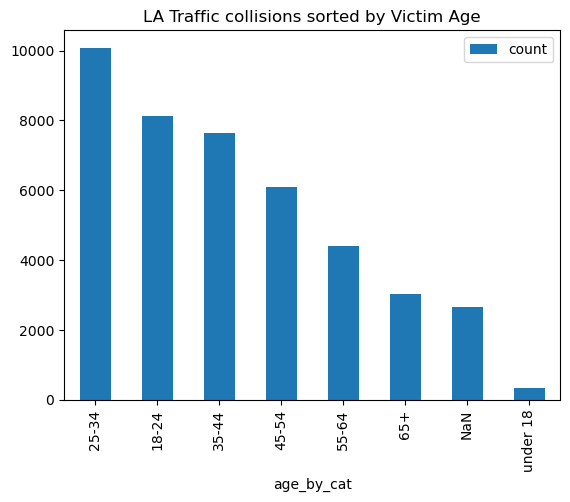

In [117]:
age_count.plot.bar(x='age_by_cat',
                        y='count',
                  title='LA Traffic collisions sorted by Victim Age')

# Creating Interactive Maps 

### Overview of Traffic Collision Locations

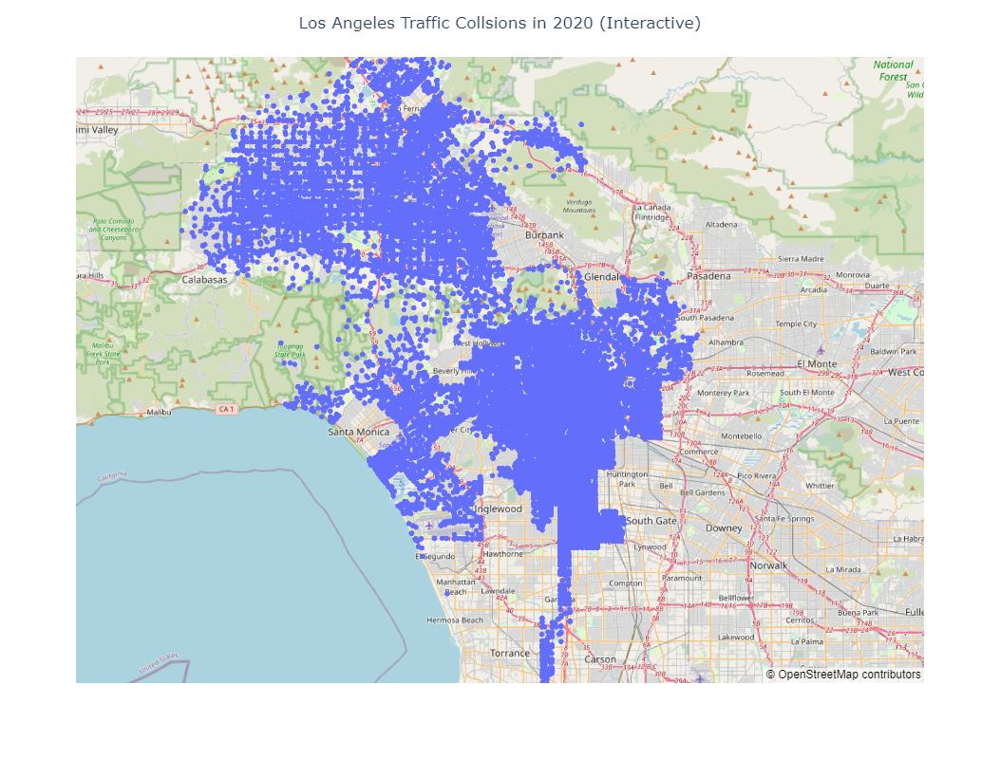

In [118]:
fig = px.scatter_mapbox(tcd, #can change style, similar to contextly's maps. 
                        lat='Latitude',
                        lon='Longitude',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

### Mapping Accidents by Location and Sex (2020) 

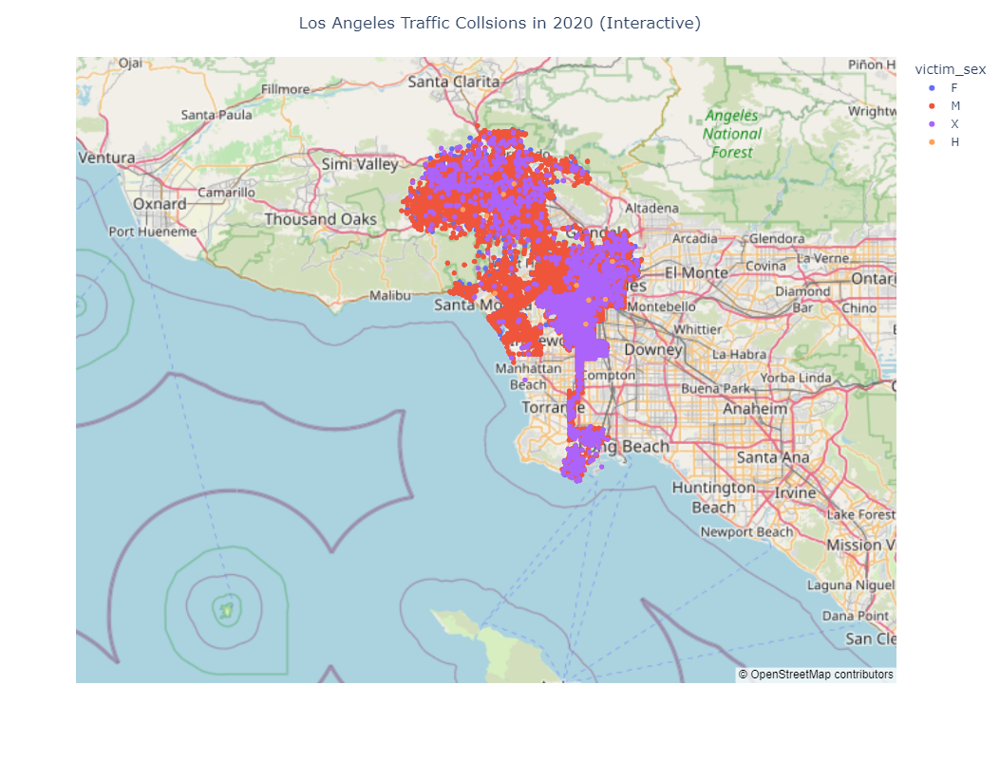

In [119]:
fig = px.scatter_mapbox(tcd, 
                        lat='Latitude',
                        lon='Longitude',
                        color='victim_sex',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

### Mapping Accidents by Location and Age (2020)

In [125]:
#dropping the nan values in order to display better on map
# df_age_cleaned = tcd.dropna(subset=['age_by_cat'], na_values=['NaN'])
df_age_cleaned = tcd[tcd['age_by_cat'] != 'NaN']
df_age_cleaned.age_by_cat.unique().tolist()

['25-34', '35-44', '55-64', '45-54', '65+', 'under 18', '18-24']

In [1]:
fig = px.scatter_mapbox(df_age_cleaned,
                        lat='Latitude',
                        lon='Longitude',
                        color='age_by_cat',
                        mapbox_style="open-street-map")

# options on the layout
fig.update_layout(
    width = 800,
    height = 800,
    title = "Los Angeles Traffic Collsions sorted by Age in 2020 (Interactive)",
    title_x=0.5 # aligns title to center
)

fig.show()

NameError: name 'px' is not defined

### Mapping Accidents by Location and Race (2020)

Get ready to break the computer! 

In [85]:
def race_map(race='H'):
    
    fig = px.scatter_mapbox(
                            tcd[tcd.victim_descent==race], 
                            lat="Latitude", 
                            lon="Longitude", 
                            color="victim_descent",
                            labels={'victim_descent':'Race'},
                            mapbox_style="carto-positron"
    )

    # options on the layout
    fig.update_layout(
        width = 600,
        height = 600,
        title = "2020 Interactive Traffic Collisions Map <br>Showing where descent label is "+race,
        title_x=0.5 # aligns title to center
    )

    fig.show()

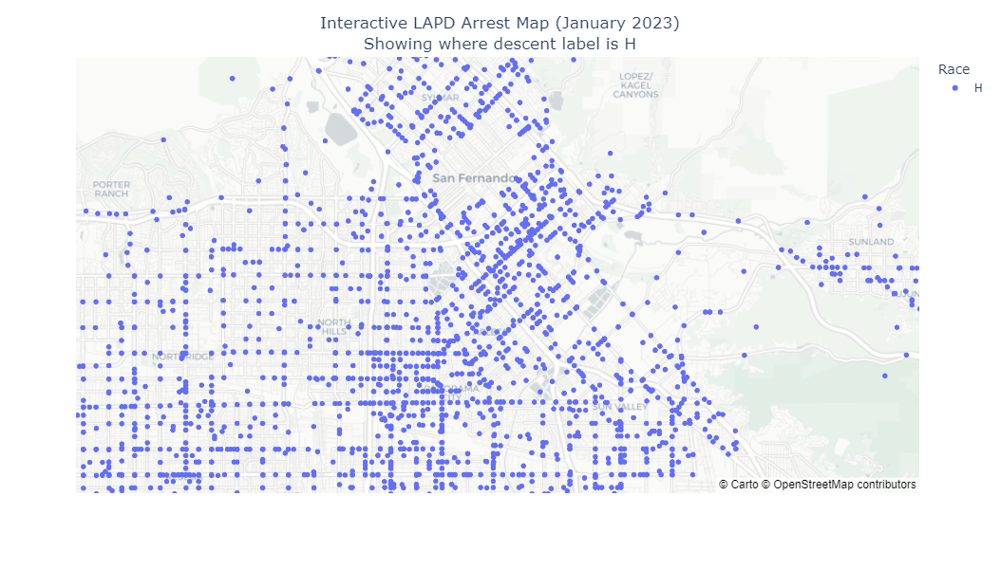

In [83]:
# call the function (try other values)
race_map(race='H')

In [95]:
# get a list of distinct race values
race_list = tcd.victim_descent.unique().tolist()
#remove nan value - its preventing for loop working later. 
race_list_clean = [x for x in race_list if not pd.isnull(x)]
print(race_list_clean)

['H', 'B', 'W', 'O', 'X', 'K', 'A', 'V', 'C', 'F', 'S', 'U', 'P', 'I', 'J', 'D', 'Z', 'G', 'L']


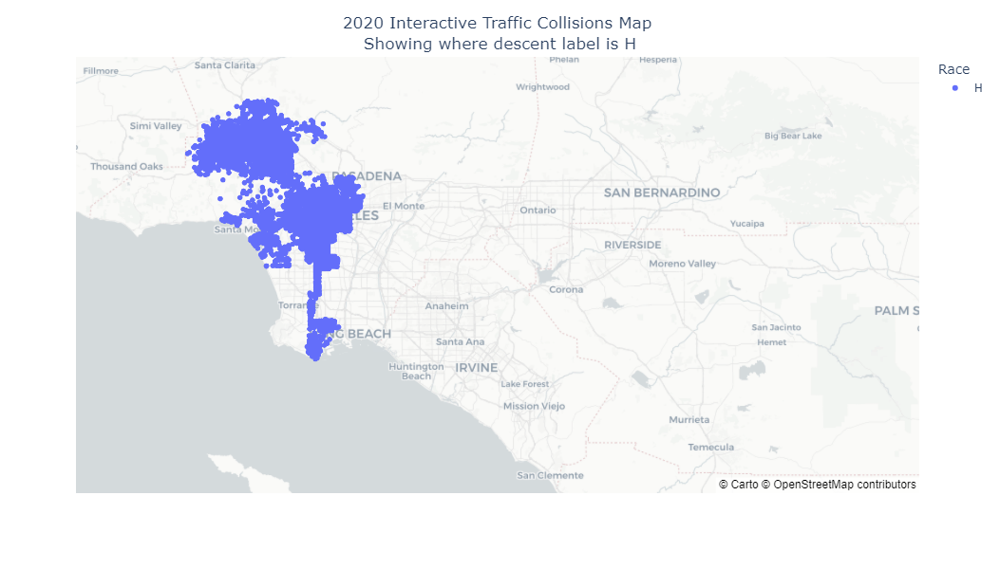

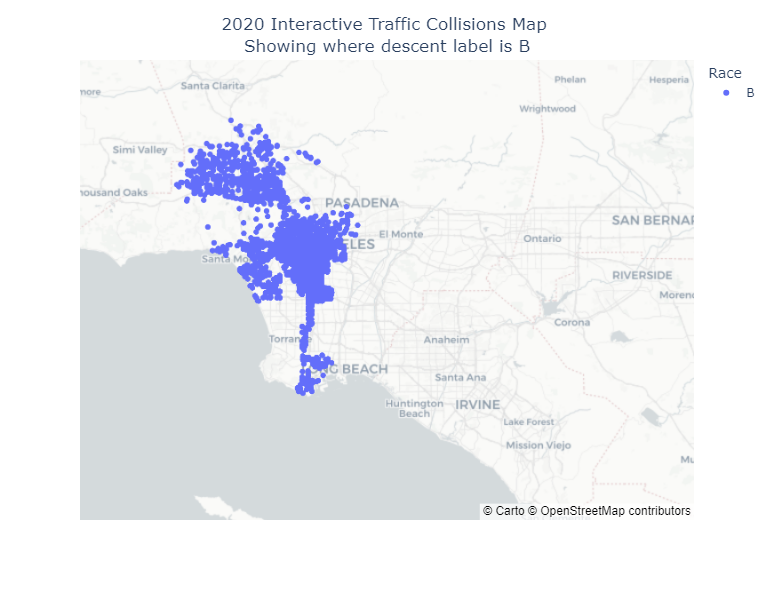

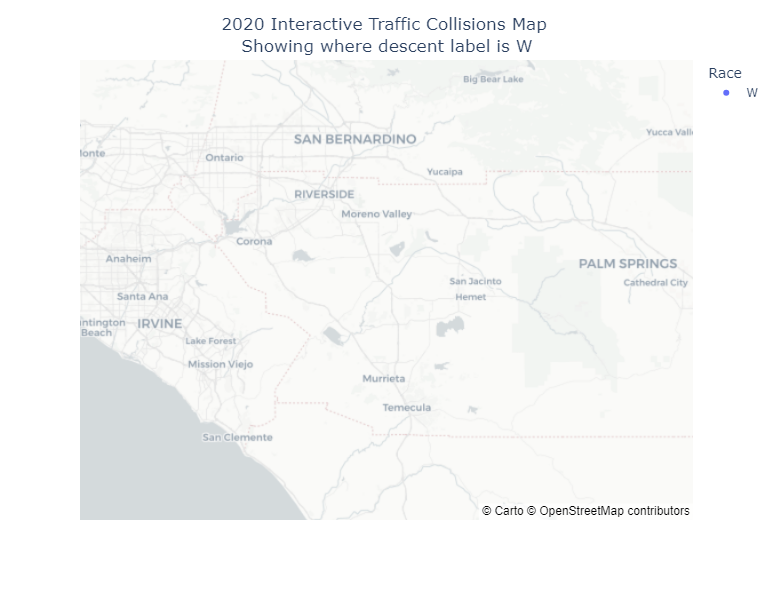

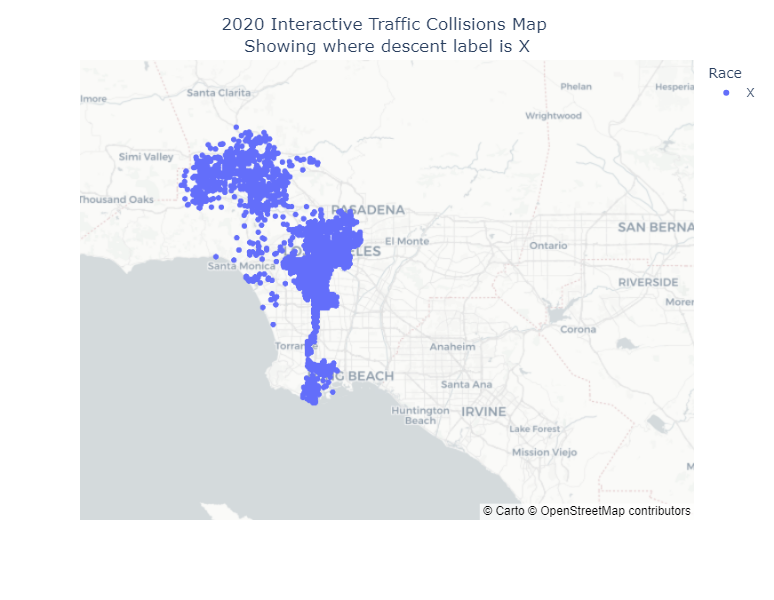

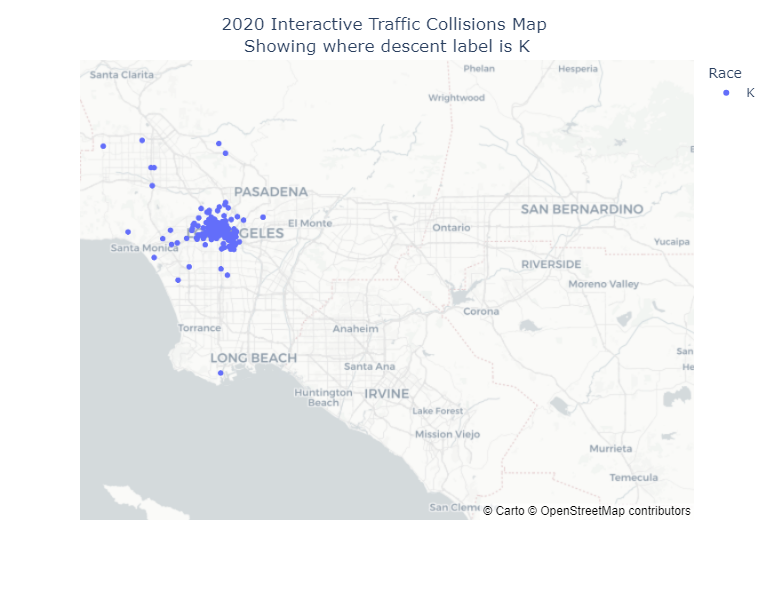

...

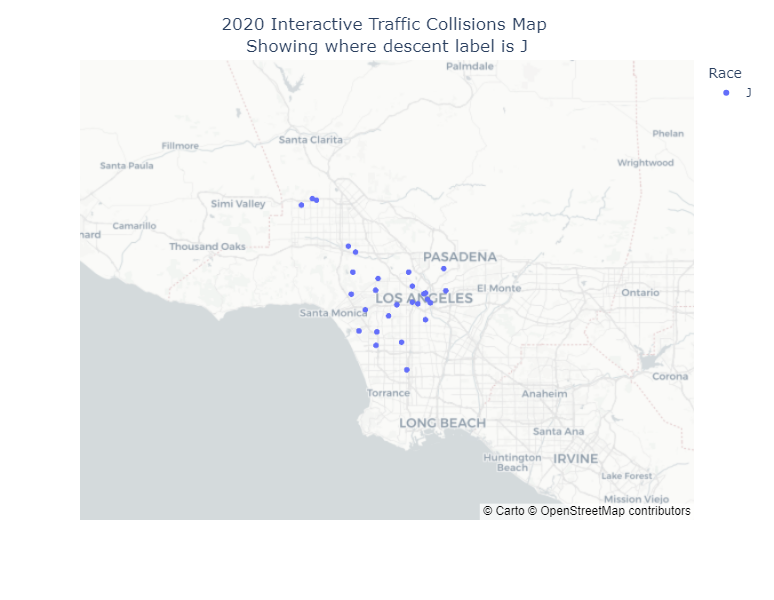

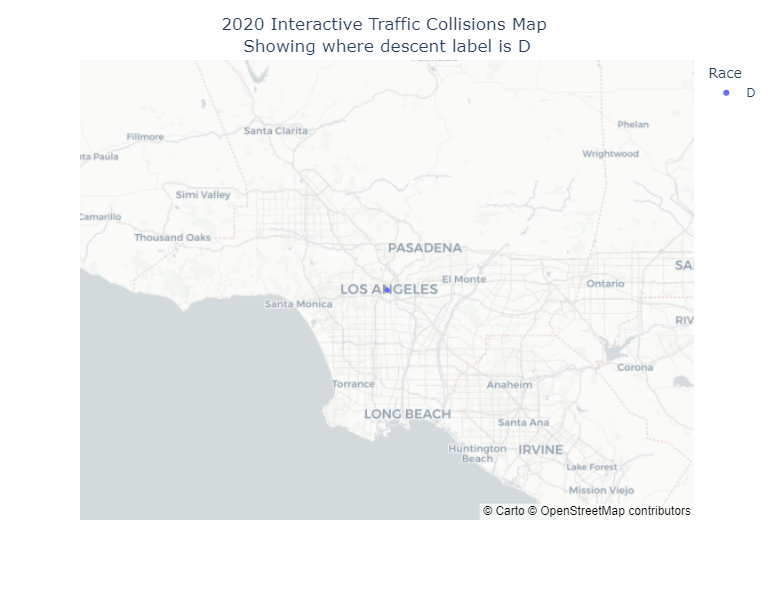

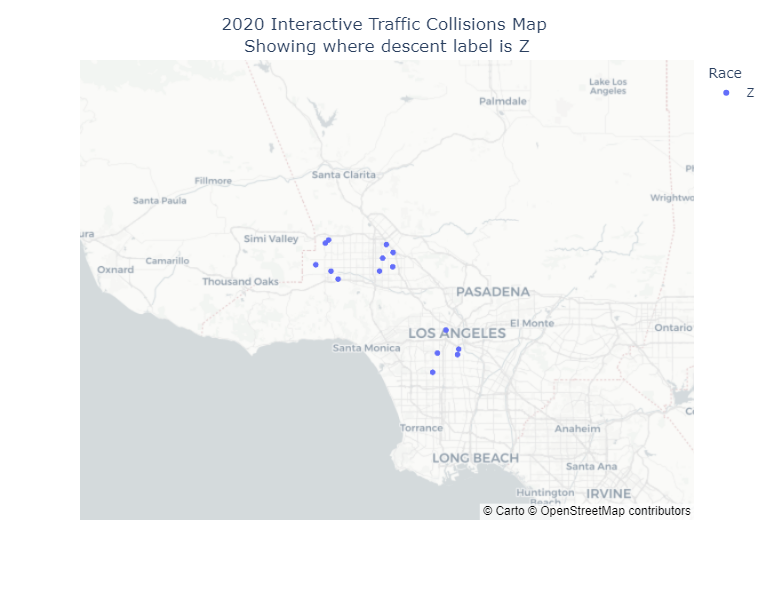

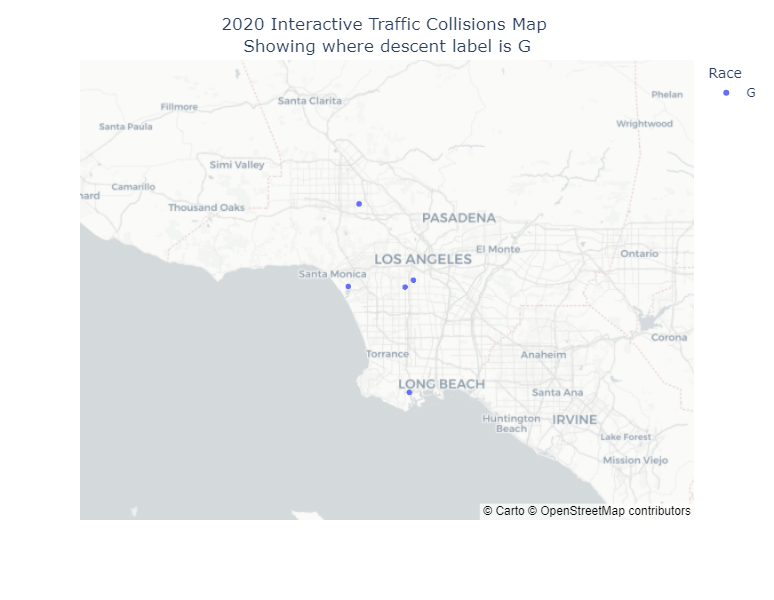

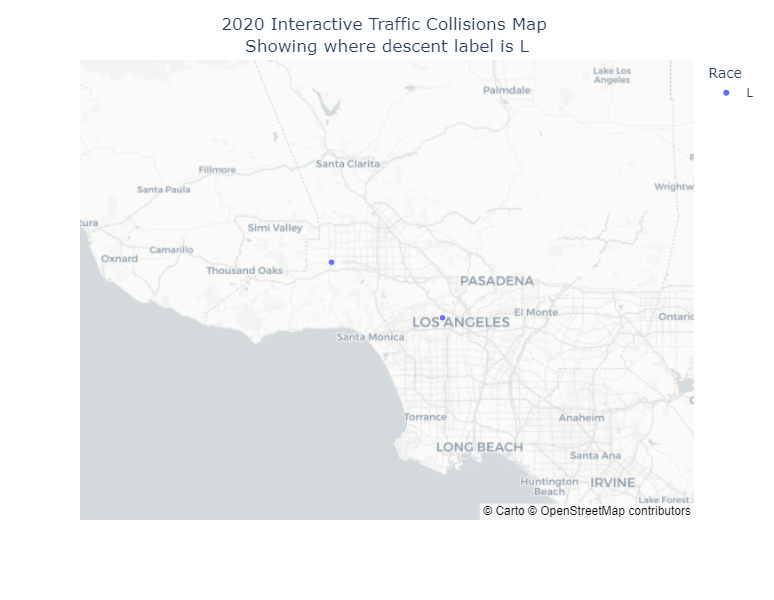

In [97]:
# loop and map!
for race in race_list_clean:
    race_map(race)

In [ ]:
Whoo! that was a lot! 